In [182]:
import pandas as pd
import numpy as np
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

## Creating a Combined Dataframe

In [120]:
avengers_endgame = pd.read_csv("./cleaned/avengers_endgame.csv")
avengers_endgame["movie"] = "Avengers Endgame"
avengers_endgame["authors"] = "Christopher Markus, and Stephen McFeely"
avengers_endgame["year"] = 2019
iron_man['character'] = iron_man['character'].replace(["JIMMY"],'AVENGERS JIMMY')
iron_man['character'] = iron_man['character'].replace(["KID"],'AVENGERS KID')

avengers = pd.read_csv("./cleaned/avengers.csv")
avengers["movie"] = "The Avengers"
avengers["authors"] = "Joss Whedon"
avengers["year"] = 2012

ragnorak = pd.read_csv("./cleaned/ragnorak.csv")
ragnorak["movie"] = "Thor: Ragnarok"
ragnorak["authors"] = "Eric Pearson, Craig Kyle, and Christopher Yost"
ragnorak["year"] = 2017

iron_man = pd.read_csv("./cleaned/iron_man.csv")
iron_man["movie"] = "Iron Man"
iron_man["authors"] = "Mark Fergus, Hawk Ostby, Art Marcum, Matt Holloway, and John August"
iron_man["year"] = 2008
iron_man['character'] = iron_man['character'].replace(["JIMMY"],'IRON MAN JIMMY')
iron_man['character'] = iron_man['character'].replace(["KID"],'IRON MAN KID')

guardians2 = pd.read_csv("./cleaned/guardians2.csv")
guardians2["movie"] = "Guardians of the Galaxy Vol. 2"
guardians2["authors"] = "James Gunn"
guardians2["year"] = 2017


combined = pd.concat([avengers_endgame, avengers, ragnorak, iron_man, guardians2])

combined

,character,line,movie,authors,year
0,CLINT BARTON,"Okay, you see where you’re going? Let’s work on how to get there.",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019
1,CLINT BARTON,"Okay, good...tip down...bow arm out...three fingers-",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019
2,LILA BARTON,Why three?,Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019
3,CLINT BARTON,‘Cause two’s not enough and four’s too much-,Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019
4,LAURA BARTON,"You guys want mustard or mayo, or both?",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019
5,LILA BARTON,Who puts mayo on a hot dog?,Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019
6,CLINT BARTON,"We’ll both have mustard, hon! Okay. Draw back, deep breath...",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019
7,CLINT BARTON,"Good job, Hawkeye. Go get your arrow.",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019
8,LAURA BARTON,Enough murder practice! Soup’s on!,Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019
9,CLINT BARTON,"One sec, babe. Be right there! We’re gonna kill some hot dogs. We’re hungry.",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019


## Removing Character Name Aliases

Some characters go by different names in different movies.  Also, some characters start out as `MYSTERIOUS MAN` and be revealed to be `EGO`.  This cell fixes that by assigning the same lines to the same name.  These choices are very subjective.  For example, I've decided that `HULK` is a different character than `BRUCE BANNER`, and that all reporter characters are named `REPORTER`.

When adding a new movie to this dataset, be careful to see that the extra characters (`MAN`, `WOMAN`, `KID` etc.) are being assigned to who they actually are.  For example, in Iron Man, `MAN` is `AGENT COULSON`, but `MAN` could be somebody else in a different movie.

In [121]:
combined['character'] = combined['character'].replace(['IRON MAN','TONY',"VOICE"],'TONY STARK')
combined['character'] = combined['character'].replace(['BANNER','SMART HULK', 'ASTRAL BANNER'],'BRUCE BANNER')
combined['character'] = combined['character'].replace(['STEVE','CAPTAIN AMERICA', 'OLD STEVE'],'STEVE ROGERS')
combined['character'] = combined['character'].replace(['BARTON'],'CLINT BARTON')
combined['character'] = combined['character'].replace(['PEPPER'],'PEPPER POTTS')
combined['character'] = combined['character'].replace(['COULSON', 'MAN'],'AGENT COULSON')
combined['character'] = combined['character'].replace(['AGENT JASPER SITWELL'],'AGENT SITWELL')
combined['character'] = combined['character'].replace(['STRANGE'],'DR. STRANGE')
combined['character'] = combined['character'].replace(['SCRAPPER #142'],'VALKYRIE')
combined['character'] = combined['character'].replace(['LOKIE'],'LOKI')
combined['character'] = combined['character'].replace(['QUILL'],'PETER QUILL')
combined['character'] = combined['character'].replace(['MONSTROUS RAVAGER'],'TASERFACE')
combined['character'] = combined['character'].replace(['MYSTERIOUS MAN'],'EGO')
combined['character'] = combined['character'].replace(["WOMAN’S VOICE"],'CHRISTINE')
combined['character'] = combined['character'].replace(["HOODED FIGURE"],'RED SKULL')
combined['character'] = combined['character'].replace(["ADOLESCENT GROOT"],'GROOT')
combined['character'] = combined['character'].replace(["GABRIEL"],'GENERAL GABRIEL')
combined['character'] = combined['character'].replace(["HOGAN"],'HAPPY HOGAN')

combined['character'] = combined['character'].replace(["REPORTER # 1", "REPORTER #2", "REPORTER #3","TV REPORTER’S VOICE",
                                                      "MALE REPORTER"],'REPORTER')
combined['character'] = combined['character'].replace(["INTERCOM VOICE", "HELICARRIER INTERCOM"],'INTERCOM')
combined['character'] = combined['character'].replace(["JET PILOT", "YOUNG SHIELD PILOT", "FACELESS PILOT"],'PILOT')

## Analyzing Line Count Distribution

### Line Count by Movie (alphabetical)

In [152]:
line_count = pd.DataFrame(combined.groupby(["movie","character"]).line.nunique())
line_count.reset_index(inplace=True)
line_count = line_count.pivot(index="character", columns="movie", values="line")
line_count.fillna(0, inplace=True)
line_count["total"] = line_count.sum(axis=1)
line_count = line_count.astype("int64")
line_count

movie,Avengers Endgame,Guardians of the Galaxy Vol. 2,Iron Man,The Avengers,Thor: Ragnarok,total
character,,,,,,
A1 CLINT BARTON,1,0,0,0,0,1
A1 HULK,2,0,0,0,0,2
A1 NATASHA,2,0,0,0,0,2
A1 STEVE,8,0,0,0,0,8
A1 THOR,6,0,0,0,0,6
A1 TONY,3,0,0,0,0,3
ABU,0,0,5,0,0,5
ACTOR LOKI,0,0,0,0,11,11
ACTOR ODIN,0,0,0,0,3,3


### Line Count by Movie (total line count)

In [123]:
line_count.sort_values(by="total", ascending=False)

movie,Avengers Endgame,Guardians of the Galaxy Vol. 2,Iron Man,The Avengers,Thor: Ragnarok,total
character,,,,,,
TONY STARK,163,0,310,170,0,643
THOR,76,0,0,47,343,466
STEVE ROGERS,131,0,0,127,0,258
BRUCE BANNER,103,0,0,86,66,255
PETER QUILL,10,210,0,0,0,220
ROCKET,59,139,0,0,0,198
NATASHA,74,0,0,101,3,178
PEPPER POTTS,16,0,124,30,0,170
LOKI,1,0,0,74,88,163


,total
count,186.000000
mean,26.758065
std,71.731787
min,1.000000
25%,1.000000
50%,4.000000
75%,15.750000
max,643.000000


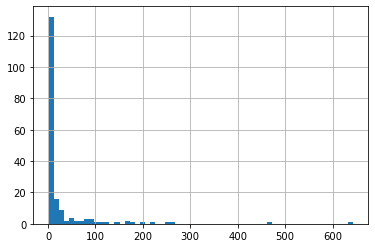

In [131]:
line_count['total'].hist(bins=60)
pd.DataFrame(line_count['total']).describe()

## Analyzing Word Count Distributions

,words
count,5044.000000
mean,10.236915
std,10.598077
min,1.000000
25%,4.000000
50%,7.000000
75%,13.000000
max,142.000000


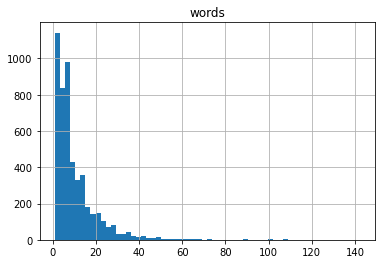

In [125]:
combined["words"] = combined["line"].str.split(" ").str.len()

combined.hist(column="words", bins=60)
pd.DataFrame(combined["words"]).describe()

In [167]:
threshold = 10
#word_cutoff_table = pd.DataFrame(combined.groupby("character").line.nunique())

above_threshold = combined["words"] >= threshold

combined_high_word_count = combined[above_threshold]
combined_low_word_count = combined[~above_threshold]

#print(combined_high_word_count.shape[0], "examples above", threshold)
#print(combined_low_word_count.shape[0], "examples below", threshold)

high_word_line_count = pd.DataFrame(combined_high_word_count.groupby("character").line.nunique())
low_word_line_count = pd.DataFrame(combined_low_word_count.groupby("character").line.nunique())

word_count_table = high_word_line_count.join(low_word_line_count, how='outer', lsuffix=' high word count', 
                                             rsuffix=' low word count')
word_count_table.fillna(0, inplace=True)
word_count_table.columns = ["lines above threshold", "lines below threshold"]
word_count_table['total'] = word_count_table.sum(axis=1)
word_count_table['% above threshold'] = word_count_table['lines above threshold'] / word_count_table['total']
word_count_table['% below threshold'] = word_count_table['lines below threshold'] / word_count_table['total']
word_count_table = word_count_table.astype({'lines above threshold': "int64", 
                                            'lines below threshold': "int64",
                                            'total': "int64"})
word_count_table.sort_values(by='total', inplace=True, ascending=False)

word_count_table

,lines above threshold,lines below threshold,total,% above threshold,% below threshold
character,,,,,
TONY STARK,280,362,642,0.436137,0.563863
THOR,170,295,465,0.365591,0.634409
STEVE ROGERS,74,184,258,0.286822,0.713178
BRUCE BANNER,99,152,251,0.394422,0.605578
PETER QUILL,79,141,220,0.359091,0.640909
ROCKET,64,134,198,0.323232,0.676768
NATASHA,64,114,178,0.359551,0.640449
PEPPER POTTS,53,117,170,0.311765,0.688235
LOKI,67,95,162,0.413580,0.586420


## Correlation Between Word Count and Line Count

I wonder if there's any correlation between a character's `mean_word_count` and their `total_line_count`.  Let's also use `log(total_line_count)` because most characters have very few lines.  This will just make it clearer to see if there's a relationship.

In [191]:
mean_word_count = combined.groupby('character')['words'].mean()
total_line_count = combined.groupby('character').line.nunique()

word_line_distribution = pd.DataFrame([mean_word_count, total_line_count]).transpose()
word_line_distribution.columns = ['mean word count', 'total line count']
word_line_distribution['log(total line count)'] = np.log10(word_line_distribution['total line count'])

word_line_distribution.corr(method='pearson')

,mean word count,total line count,log(total line count)
mean word count,1.000000,0.137282,0.329994
total line count,0.137282,1.000000,0.699299
log(total line count),0.329994,0.699299,1.000000


There appears to be little correlation between `mean_word_count` and both `total_line_count` and `log(total_line_count)` (`0.137282` and `0.699299` respectively).

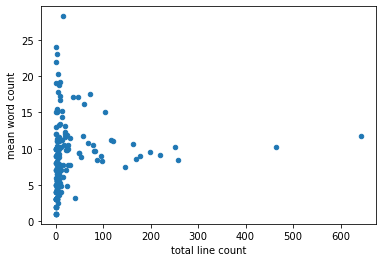

In [192]:
word_line_distribution.plot.scatter(x='total line count', y='mean word count')

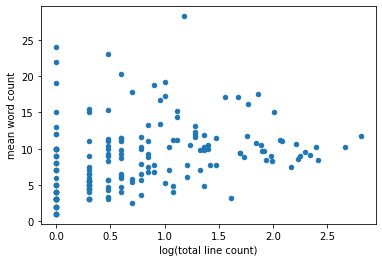

In [193]:
word_line_distribution.plot.scatter(x='log(total line count)', y='mean word count')

## Create mcu.csv

In [194]:
combined

,character,line,movie,authors,year,words
0,CLINT BARTON,"Okay, you see where you’re going? Let’s work on how to get there.",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019,13
1,CLINT BARTON,"Okay, good...tip down...bow arm out...three fingers-",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019,7
2,LILA BARTON,Why three?,Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019,2
3,CLINT BARTON,‘Cause two’s not enough and four’s too much-,Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019,8
4,LAURA BARTON,"You guys want mustard or mayo, or both?",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019,8
5,LILA BARTON,Who puts mayo on a hot dog?,Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019,7
6,CLINT BARTON,"We’ll both have mustard, hon! Okay. Draw back, deep breath...",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019,12
7,CLINT BARTON,"Good job, Hawkeye. Go get your arrow.",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019,9
8,LAURA BARTON,Enough murder practice! Soup’s on!,Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019,6
9,CLINT BARTON,"One sec, babe. Be right there! We’re gonna kill some hot dogs. We’re hungry.",Avengers Endgame,"Christopher Markus, and Stephen McFeely",2019,15
